In [2]:
import warnings
warnings.filterwarnings("ignore") # ignores warnings when using TensorFlow backend
import numpy as np # linear algebra
from numpy.random import random # smooth labeling
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt # graphs
%matplotlib notebook
import ast # datetime
import os # file system
import time
import cv2 # OpenCV2
import pprint
# from keras.datasets import mnist
from keras.models import Sequential, Model
from keras.layers import Dense, Activation, Flatten, Reshape, Input
from keras.layers import Conv2D, Conv2DTranspose, UpSampling2D, MaxPooling2D, ZeroPadding2D, AveragePooling2D
from keras.layers import LeakyReLU, Dropout, GaussianNoise
from keras.layers import BatchNormalization
from keras.optimizers import Adam, RMSprop
from keras.initializers import RandomNormal
from keras.preprocessing.image import ImageDataGenerator
import keras.backend as K
import matplotlib.pyplot as plt
print('File Tree', end=': ')
for dirname, _, filenames in os.walk('/GAN'): # kaggle/input
    print(dirname)

Using TensorFlow backend.


File Tree: 

Credit Goes to 
[lbpcascade_animeface](https://github.com/nagadomi/lbpcascade_animeface) for the lbpcascade used in our OpenCV2 model.
[MyWaifuList](https://www.kaggle.com/corollari/waifus) for the dataset of images of anime faces and also the actual website [MyWaifuList](https://mywaifulist.moe/).

**Below are some of the basic tools that would be necessary later on. **

### Timer

In [3]:
class Timer:
    '''
    Initialize a Timer() constructor before fitting GAN
    Then call .timer() on the constructor for the time elapsed
    '''
    def __init__(self):
        self.start_time = time.time()
    def elapsed_time(self,s):
        if s < 60: 
            return '{:7.2f} sec'.format(s)
        elif s < (60 * 60):  
            return '{:7.2f} min'.format(s/60)
        else:
            return '{:7.2f} hr'.format(s/60/60)
    def timer(self):
        print("Time elapsed: {}".format(self.elapsed_time(time.time() - self.start_time)))

### AnimeFace OpenCV2(lbpcascade)

In [4]:
class AnimeFace:
    def __init__(self):
        self.cascadefile = "GAN/datafiles/lbpcascade_animeface.xml" # kaggle/input/datafiles/lbpcascade_animeface.xml
    
    def make_image_for_plt(self, image):
        '''
        For some reasons, calling cv2.imshow(str, cv2_image_object) crashes the Kaggle kernel,
        so I used plt.imshow(cv2_image_object) instead.
        However, OpenCV2 module reads and displays image as BGR format, instead of
        the usual RGB format. So this function converts the color of the image so it can
        be printed with plt without any issues in coloring.
        '''
        newimage = cv2.imread(image, cv2.IMREAD_COLOR)
        RGB_image = cv2.cvtColor(newimage, cv2.COLOR_BGR2RGB)
        RGB_pixels = np.array(RGB_image)
        return RGB_pixels
    
    def get_rectangles(self, img):
        '''
        Python example code extracted from
        https://github.com/nagadomi/lbpcascade_animeface/blob/master/README.md#python-example
        '''
        try:
            cascade = cv2.CascadeClassifier(self.cascadefile) # lbpcascade_animeface
            image = cv2.imread(img, cv2.IMREAD_COLOR) # read img file
            gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY) # convert to gray for faster computation
            gray = cv2.equalizeHist(gray)
            faces = cascade.detectMultiScale(gray,
                                             # detector options
                                             scaleFactor = 1.1,
                                             minNeighbors = 5,
                                             minSize = (24, 24))
            return faces
        except:
            return None
  
    def show_result(self, image) -> None:
        '''
        This function is used to confirm that the OpenCV2 has
        successfully cropped the images of face from the
        given file. 
        '''
        faces = self.get_rectangles(image)
        image = self.make_image_for_plt(image)
        for image_vertexes in faces:
            # 0 -> x, 1 -> y, 2 -> w, 3 -> h
            # image_vertexes = list(map(int, image_vertexes))
            cv2.rectangle(
                image,
                (image_vertexes[0], image_vertexes[1]),
                (image_vertexes[0] + image_vertexes[2], image_vertexes[1] + image_vertexes[3]),
                (255, 0, 0),
                2
            )
        plt.imshow(image)
        #cv2.imwrite("/kaggle/input/datafiles/{}_out.png".format(self.instancefilenumbers), image)
        
    def crop(self, image) -> list:
        '''
        This function crops only the faces of the anime characters in the
        given image file for easier degree of computation for my GAN.
        '''
        out = []
        faces = self.get_rectangles(image)
        if faces is None:
            return None
        image = self.make_image_for_plt(image)
        for [x, y, w, h] in faces:
            out.append(image[y:y+h, x:x+w])
        return out

### Data Loader

In [5]:
class Data_Loader:
    def __init__(self, filepath):
        self.filepath = filepath
        self.dataset = self.get_image_files()
    '''
    returns a list of filepaths for the input files
    '''
    def load_data(self, start):
        out = []
        err = 0
        AF = AnimeFace()
        batch = self.dataset[start:]
        for filepath in batch:
            faces = AF.crop(filepath)
            if faces == None:
                err += 1
            else:
                for ea in faces:
                    out.append(ea)
            if len(out) == 64:
                return out, err
                    
    def get_image_files(self):
        meow = []
        for dirname, _, filenames in os.walk(self.filepath): # '/kaggle/input/waifus/waifus/images/' = self.filepath
            for filename in filenames:
                meow.append(os.path.join(dirname, filename))
        return sorted(meow)

### Let's make sure my lbpcascade is working correctly.

In [6]:
# custom images for sample testing on lbpcascade OpenCV
testfiles = []
test = AnimeFace()
for dirname, _, filenames in os.walk('GAN/testsamples'): #kaggle/input/testsamples
    for filename in filenames:
        testfiles.append(os.path.join(dirname, filename))
testfiles.append('GAN/waifus/images/4733.png') # model input files
testfiles.append('GAN/waifus/images/6309.png') # kaggle/input/waifus/waifus/images/6309.png
testfiles.append('GAN/waifus/images/15419.jpeg')
testfiles = sorted(testfiles)
print(testfiles)

['GAN/testsamples\\Niina.jpg', 'GAN/testsamples\\imas.jpg', 'GAN/testsamples\\imas2.jpg', 'GAN/testsamples\\imas_nico.jpg', 'GAN/testsamples\\test1.jpg', 'GAN/testsamples\\test2.jpg', 'GAN/testsamples\\yukino_yui.png', 'GAN/waifus/images/15419.jpeg', 'GAN/waifus/images/4733.png', 'GAN/waifus/images/6309.png']


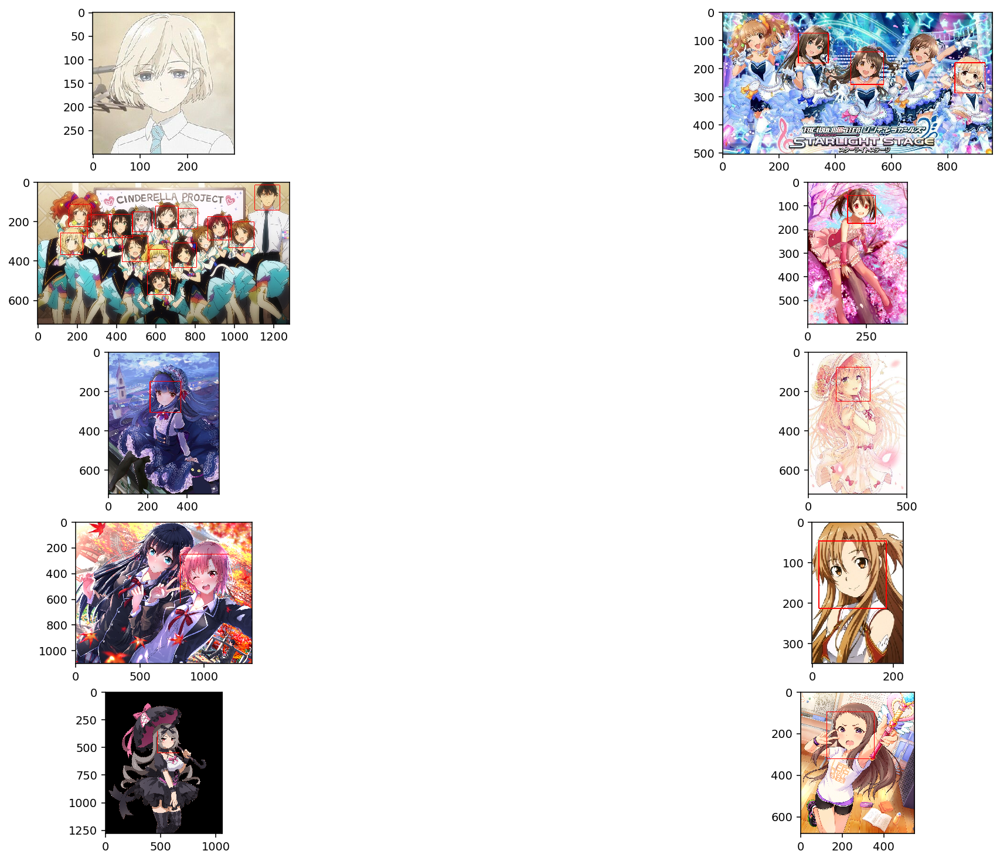

In [7]:
fig = plt.figure(figsize=(20, 16), dpi= 140, facecolor='w', edgecolor='k')
for path in testfiles:
    fig.add_subplot(6, 2, testfiles.index(path)+1)
    test.show_result(path)
plt.show()

### and some cropped images of faces from the previous test samples

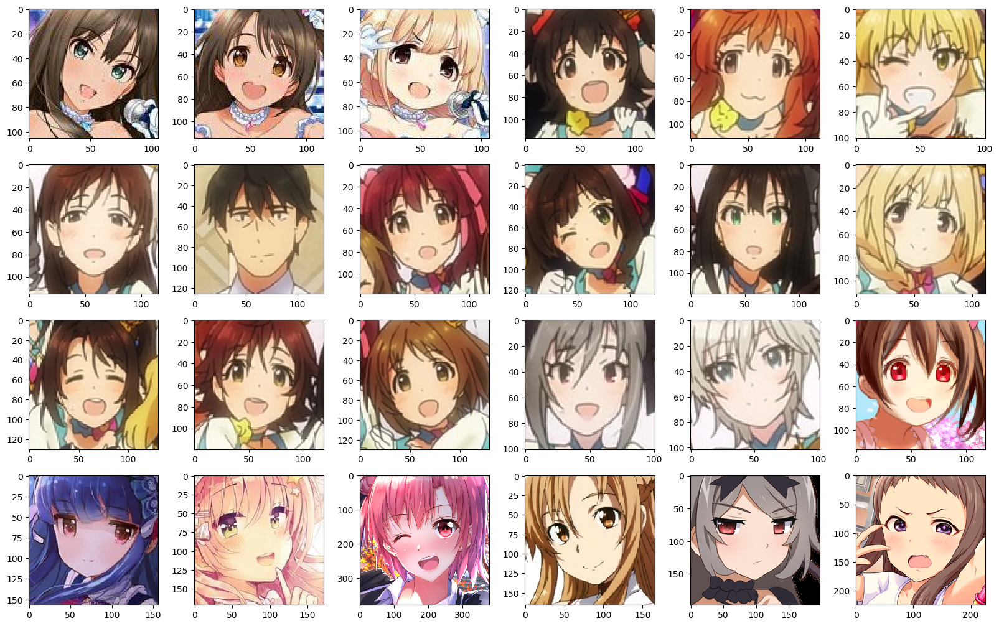

In [8]:
fig_two = plt.figure(figsize=(20, 16), dpi= 100, facecolor='w', edgecolor='k')
iteration = 1
for filepath in testfiles:
        faces = test.crop(filepath)
        if faces == None:
            pass
        else:
            for ea in faces:
                fig_two.add_subplot(5, 6, iteration)
                plt.imshow(ea)
                iteration += 1
plt.show()

#### As you can see, the lbpcascade seems to fail on certain images. Still, It at least didn't do any false detection that would mess up the network. So I decided to proceed with this OpenCV2 model for my GAN.

# Here, we set up how our Generative Adversarial Network

In [5]:
class BuildGAN:
    def __init__(self):
        self.Discriminator = None
        self.Generator = None
        self.AdversarialModel = None
        self.DiscriminatorModel = None
        self.dropoutrate_d = 0.35 ## 0.3
        self.leakyreluparam = 0.2
        self.batchnormmomentum= 0.8 ## 0.8 https://medium.com/@ilango100/batchnorm-fine-tune-your-booster-bef9f9493e22
        self.kernel_initializer = RandomNormal(mean=0.0, stddev=0.02)
        '''
        Gaussian distribution reportedly worked the best with DCGAN
        '''
    
    def build_discriminator(self):
        if self.Discriminator:
            return self.Discriminator
        # D = Sequential()
        '''
        will use Model(), not Sequential()
        '''
        input_tensor = Input(shape=(128, 128, 3))
        '''
        ^^^ Input Layer Definition
        VVV Output Layer Definition
        '''
        def repeatlayering(layers, filters, shape=(4, 4), pool="AVG", batch=True):
            '''
            https://github.com/vdumoulin/conv_arithmetic
            Convolutional Layers Visualization
            '''
            x = Conv2D(filters, shape, padding="same", kernel_initializer=self.kernel_initializer) (layers)
            #if pool=="MAX":
                #x = MaxPooling2D() (x)
            '''
            https://arxiv.org/pdf/1412.6806.pdf
            Convoluttional layer with strides to downsample has higher accuracy but requires more computations
            Pooling is not necessarily a learnable layer of parameters. . .
            '''
            if pool=="AVG":
                x = AveragePooling2D() (x)
            if batch:
                x = BatchNormalization(momentum=self.batchnormmomentum) (x)
            x = LeakyReLU(alpha=self.leakyreluparam) (x)
            x = Dropout(self.dropoutrate_d) (x)
            return x
        ### Layering
        l = input_tensor
        # 128x128
        l = GaussianNoise(0.1) (l)
        l = repeatlayering(l, 64, batch=False)
        # 64x64
        l = repeatlayering(l, 128)
        # 32x32
        l = repeatlayering(l, 256)
        # 16x16
        l = repeatlayering(l, 512)
        # 8x8
        l = repeatlayering(l, 1024)
        # 4x4
        #l = Conv2D(1024, (4, 4), padding="same", kernel_initializer=self.kernel_initializer) (l)
        #l = MaxPooling2D() (l)
        #l = BatchNormalization(momentum=self.batchnormmomentum) (l)
        #l = LeakyReLU(alpha=self.leakyreluparam) (l)
        l = Flatten() (l)
        ### sigmoid activation output layer for discriminator NN
        l = Dense(1, kernel_initializer=self.kernel_initializer) (l)
        l = Activation("sigmoid") (l) #hard_sigmoid?
        self.Discriminator = Model(inputs=input_tensor, outputs=l)
        return self.Discriminator
    
    def build_generator(self):
        if self.Generator:
            return self.Generator
        # G = Sequential()
        '''
        same for generator net, using Model()
        '''
        input_tensor = Input(shape=(1, 1, 100))
        '''
        ^^^ Input Layer Definition
        VVV Output Layer Definition
        '''
        def repeatlayering(layers, filters, shape=(4, 4), paddingval='same', strides=True):
            if strides:
                #x = Conv2DTranspose(filters, shape, padding=paddingval, strides=(2, 2), kernel_initializer=self.kernel_initializer) (layers)
                x = UpSampling2D((2, 2)) (layers)
                x = Conv2D(filters, shape, padding=paddingval) (x)
            else:
                x = Conv2DTranspose(filters, shape, padding=paddingval, kernel_initializer=self.kernel_initializer) (layers)
            #x = Conv2D(filters, shape, padding=paddingval) (x)
            x = BatchNormalization(momentum=self.batchnormmomentum) (x)
            x = LeakyReLU(alpha=self.leakyreluparam) (x)
            return x
        
        ### Layering
        l = input_tensor
        #l = GaussianNoise(0.2) (l)
        l = repeatlayering(l, 1024, paddingval="valid", strides=False)
        #l = Dropout(self.dropoutrate_g) (l)
        l = repeatlayering(l, 512)
        #l = Dropout(self.dropoutrate_g) (l)
        l = repeatlayering(l, 256) 
        #l = Dropout(self.dropoutrate_g) (l)
        l = repeatlayering(l, 128)
        #l = Dropout(self.dropoutrate_g) (l)
        l = repeatlayering(l, 64)
        #l = Dropout(self.dropoutrate_g) (l)
        #l = repeatlayering(l, 64, shape=(3, 3), strides=False)
        l = Conv2D(64, (3, 3), padding='same', kernel_initializer=self.kernel_initializer) (l)
        l = BatchNormalization(momentum=self.batchnormmomentum) (l)
        l = LeakyReLU(alpha=self.leakyreluparam) (l)
        #l = GaussianNoise(0.2) (l)
        ### tanh activation output layer for generator NN
        l = Conv2DTranspose(3, (4, 4), padding='same', strides=(2, 2), kernel_initializer=self.kernel_initializer) (l)
        l = Activation("tanh") (l) #tanh
        # output should be 128x128 at this point
        self.Generator = Model(inputs=input_tensor, outputs=l)
        return self.Generator

In [6]:
class AnimefaceGAN:
        def __init__(self):
            self.images = []
            self.train_iterations = 0
            self.train_epochs = []
            self.total_epochs= sum(self.train_epochs)
            '''
            https://arxiv.org/pdf/1412.6980v8.pdf -> Stochastic Optimization
            '''
            self.adam_d = Adam(lr=0.0002, beta_1=0.5) #0.002 or 0.0002?
            self.adam_g = Adam(lr=0.0002, beta_1=0.5) #different learning rate for gan?
            self.loss = "binary_crossentropy"
            #self.metrics = ['accuracy']
            self.build = BuildGAN()
            self.D = self.build.build_discriminator()
            self.D.compile(self.adam_d, loss=self.loss) # metrics => ['accuracy'], loss_weights=[0.5]
            self.D.trainable = False
            '''
            By setting trainable=False after the discriminator has been compiled, 
            the discriminator is still trained during discriminator.train_on_batch 
            but since it's set to non-trainable before the combined model is compiled it's not trained 
            during combined.train_on_batch.
            eriklindernoren commented on Aug 15, 2018 
            https://github.com/eriklindernoren/Keras-GAN/issues/73
            '''
            self.G = self.build.build_generator()
            #self.G.compile(self.adam_g, loss=self.loss)
            ### GAN DEFINITION
            noise = Input(shape=(1, 1, 100))
            gen = self.G(noise)
            result = self.D(gen)
            self.GAN = Model(inputs=noise, outputs=result)
            self.GAN.compile(self.adam_g, loss=self.loss) # loss_weights=0.5

        def showsummary(self, D=False, G=False, GAN=False):
            if D:
                self.D.summary()
            if G:
                self.G.summary()
            if GAN:
                self.GAN.summary()
        
        def noise(self, batch_size):
            noise = 0.1 * np.random.ranf((batch_size,) + (1, 1, 100))
            noise -= 0.05
            noise += np.random.randint(0, 2, size=((batch_size,) + (1, 1, 100)))
            noise -= 0.5
            noise *= 2
            return noise
            
        def train(self, epochs=5000, batch_size=64, save_interval=50):
            savefilepath = "/kaggle/input/datafiles"
            '''
            During the training, if D loss becomes zero/nearly zero and out performs G,
            try reducing D's learning rate and increasing D's dropout rate.
            '''
            start = 0
            print("Training for {} epochs. . .".format(epochs))
            x = list(range(1, epochs+1)) #plot_x
            d, g = [], []
            ###
            output = plt.figure(figsize=(20, 16), dpi= 100, facecolor='w', edgecolor='k')
            iteration = 0
            ###
            for epoch in range(epochs):
                ### REAL IMAGE INPUT RANDOMIZED BATCH
                if (epoch+1) % 20 == 0 or epoch ==0:
                    t = Timer() #log time taken
                data = Data_Loader('/kaggle/input/waifus/waifus/images/')
                stop = start + batch_size
                face_images, err_increment = data.load_data(start) # list(not batch) of np arrays of face images
                for i in range(len(face_images)):
                    face_images[i] = cv2.resize(face_images[i], (128, 128), interpolation=cv2.INTER_CUBIC)
                imageset = np.asarray(face_images).astype(np.float32) # already float32 ?? .astype(np.float32) fails
                imageset = (imageset -127.5) / 127.5 # /= 128.0 -= 1.0 or /= 255.0
                # imageset = imageset.reshape((imageset.shape[0],) + (128, 128, 3)) / 128.0 - 1.0
                real = imageset
                ###
                
                ### NOISE IMAGE INPUT
                generated = self.G.predict(self.noise(batch_size))
                ###
                
                ### COMBINED INPUT
                # combined = np.concatenate([generated, real])
                smoothlabeledones = np.ones((batch_size, 1)) - (np.random.ranf((batch_size, ) + (1, )) * 0.1)
                smoothlabeledzeros = np.zeros((batch_size, 1)) + (np.random.ranf((batch_size, ) + (1, )) * 0.1)
                ###
                
                
                #d_loss = self.D.train_on_batch(combined, labels)
                d_loss_real = self.D.train_on_batch(real, smoothlabeledones)
                d_loss_fake = self.D.train_on_batch(generated, smoothlabeledzeros)
                d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)
                
                
                ###
                random_latent_vectors = self.noise(batch_size)
                # 0->fake 1->real
                a_loss = self.GAN.train_on_batch(random_latent_vectors, smoothlabeledones)
                
                if (epoch+1) % 20 == 0 or epoch == 0:
                    log_mesg = "{:d}: [D loss: {:f}".format(self.total_epochs+epoch+1, d_loss)
                    log_mesg = "{:s}  [G loss: {:f}]".format(log_mesg, a_loss)
                    print(log_mesg, end=" ")
                    t.timer()
                d.append(d_loss)
                g.append(a_loss)
                
                ###TEST
                #result = model.G.predict(model.noise(1))
                #result *= 127.5 # += 1.0 *= 127.0
                #result += 127.5
                #im = result.astype(np.uint8)[0]
                #testfig.add_subplot(20, 5, iteration+1)
                #plt.imshow(im)
                #iteration += 1
                ###
                
                ### ITERATING BATCHES THROUGH DATASET
                start += batch_size
                start += err_increment
                if start > len(imageset) - batch_size:
                    start = 0
                if epoch != 0 and epoch % save_interval == 0:
                    result = self.G.predict(self.noise(1))
                    result *= 127.5
                    result += 127.5
                    sample_image = result.astype(np.uint8)[0]
                    output.add_subplot(int((epochs/save_interval)/5)+1, 5, iteration+1)
                    plt.imshow(sample_image)
                    iteration += 1
            self.train_iterations += 1
            self.train_epochs.append(epochs)
            plt.show()
            return x, d, g
        
        def generate_images(self, batch_size=20):
            if self.train_iterations < 1:
                print("Please train the model at least once for the model to generate an image.")
            else:
                fig_x = plt.figure(figsize=(8, 12), dpi= 120, facecolor='w', edgecolor='k')
                result = self.G.predict(self.noise(batch_size))
                result *= 127.5 # += 1.0 *= 127.0 or &= 255.0
                result += 127.5
                im = result.astype(np.uint8)
                iteration = 1
                for image in im:
                    fig_x.add_subplot(5, 4, iteration)
                    iteration += 1
                    plt.imshow(image)
                plt.show()

# Initializing Model

In [7]:
model = AnimefaceGAN()

## GAN Architecture

In [8]:
model.showsummary(GAN=True)

Model: "model_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         (None, 1, 1, 100)         0         
_________________________________________________________________
model_2 (Model)              (None, 128, 128, 3)       12829699  
_________________________________________________________________
model_1 (Model)              (None, 1)                 11170241  
Total params: 23,999,940
Trainable params: 12,825,603
Non-trainable params: 11,174,337
_________________________________________________________________


## Generator Architecture

In [9]:
model.showsummary(G=True)

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, 1, 1, 100)         0         
_________________________________________________________________
conv2d_transpose_1 (Conv2DTr (None, 4, 4, 1024)        1639424   
_________________________________________________________________
batch_normalization_5 (Batch (None, 4, 4, 1024)        4096      
_________________________________________________________________
leaky_re_lu_6 (LeakyReLU)    (None, 4, 4, 1024)        0         
_________________________________________________________________
up_sampling2d_1 (UpSampling2 (None, 8, 8, 1024)        0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 8, 8, 512)         8389120   
_________________________________________________________________
batch_normalization_6 (Batch (None, 8, 8, 512)         2048

## Discriminator Architecture

In [10]:
model.showsummary(D=True)

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 128, 128, 3)       0         
_________________________________________________________________
gaussian_noise_1 (GaussianNo (None, 128, 128, 3)       0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 128, 128, 64)      3136      
_________________________________________________________________
average_pooling2d_1 (Average (None, 64, 64, 64)        0         
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 64, 64, 64)        0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 64, 64, 64)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 64, 64, 128)       1312

## Training

### 500 Epochs (total:500)

Training for 500 epochs. . .
1: [D loss: 5.581247  [G loss: 1.502937] Time elapsed:   24.87 sec
20: [D loss: 0.563103  [G loss: 6.582762] Time elapsed:   13.00 sec
40: [D loss: 0.767983  [G loss: 1.410873] Time elapsed:   13.14 sec
60: [D loss: 0.670491  [G loss: 10.784775] Time elapsed:   13.15 sec
80: [D loss: 0.322863  [G loss: 3.811208] Time elapsed:   13.24 sec
100: [D loss: 0.265208  [G loss: 3.479684] Time elapsed:   13.18 sec
120: [D loss: 0.342617  [G loss: 5.848849] Time elapsed:   12.98 sec
140: [D loss: 0.324505  [G loss: 3.033852] Time elapsed:   13.58 sec
160: [D loss: 0.492574  [G loss: 2.623185] Time elapsed:   12.95 sec
180: [D loss: 0.312355  [G loss: 3.990323] Time elapsed:   13.10 sec
200: [D loss: 0.268605  [G loss: 3.005914] Time elapsed:   13.17 sec
220: [D loss: 0.301100  [G loss: 2.801394] Time elapsed:   13.06 sec
240: [D loss: 0.332697  [G loss: 2.859734] Time elapsed:   13.31 sec
260: [D loss: 2.071481  [G loss: 3.083639] Time elapsed:   13.13 sec
280: [D lo

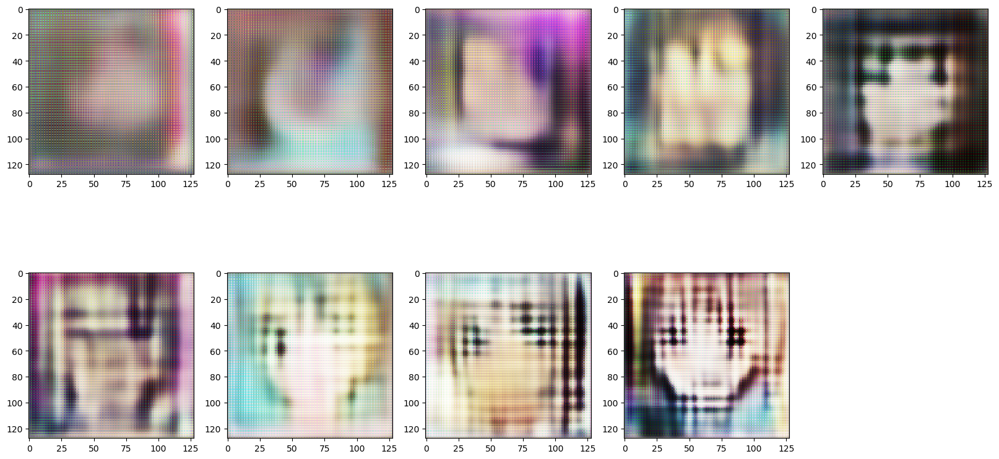

Time elapsed:    1.83 hr


In [11]:
timer = Timer()
e, d, g = model.train(epochs=500)
timer.timer()

### Some output images after 500 epochs

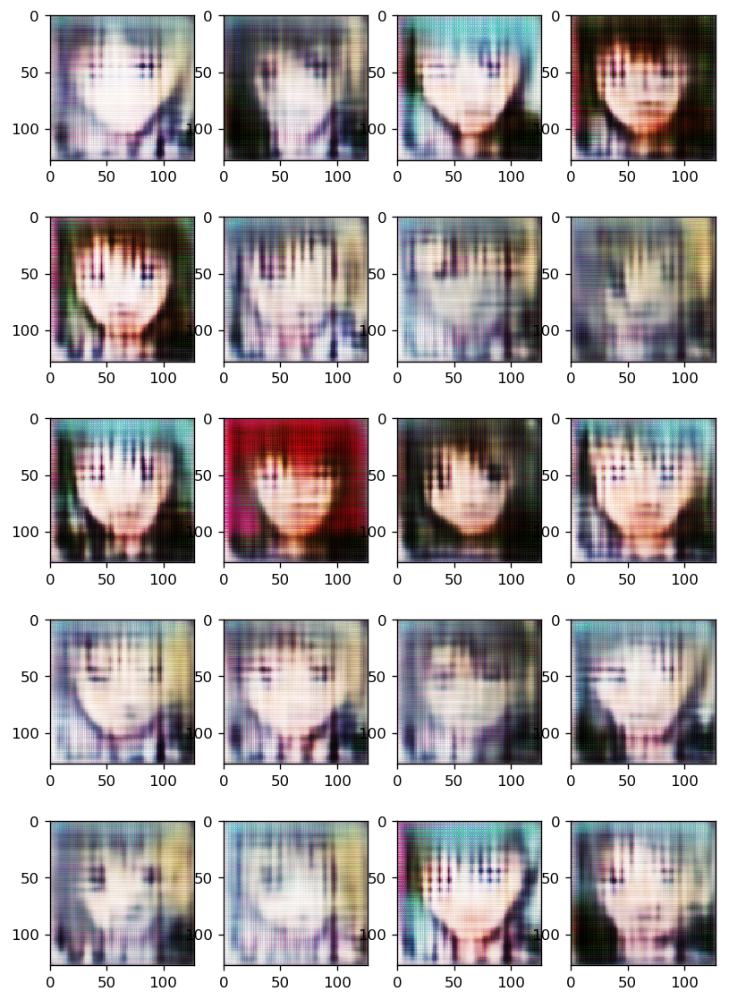

In [12]:
model.generate_images()

### 500 Epochs (total:1000)

Training for 500 epochs. . .
1: [D loss: 0.273356  [G loss: 0.740993] Time elapsed:   13.12 sec
20: [D loss: 0.256838  [G loss: 2.411568] Time elapsed:   13.14 sec
40: [D loss: 0.267086  [G loss: 4.316695] Time elapsed:   13.01 sec
60: [D loss: 0.300080  [G loss: 3.283865] Time elapsed:   13.07 sec
80: [D loss: 0.248307  [G loss: 2.046062] Time elapsed:   12.99 sec
100: [D loss: 0.486198  [G loss: 2.874073] Time elapsed:   12.80 sec
120: [D loss: 0.312669  [G loss: 0.922523] Time elapsed:   12.81 sec
140: [D loss: 0.332449  [G loss: 2.550434] Time elapsed:   12.93 sec
160: [D loss: 0.245389  [G loss: 2.738949] Time elapsed:   12.75 sec
180: [D loss: 0.264554  [G loss: 2.536714] Time elapsed:   12.96 sec
200: [D loss: 1.149986  [G loss: 4.363085] Time elapsed:   12.98 sec
220: [D loss: 0.571590  [G loss: 2.957965] Time elapsed:   12.98 sec
240: [D loss: 0.297703  [G loss: 0.968602] Time elapsed:   12.89 sec
260: [D loss: 0.595208  [G loss: 2.242981] Time elapsed:   12.96 sec
280: [D los

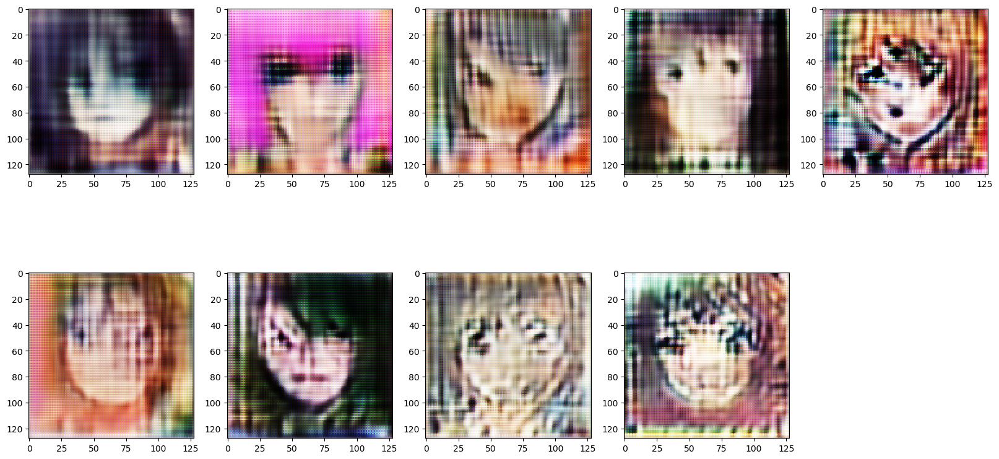

Time elapsed:    1.81 hr


In [13]:
timer = Timer()
e_1, d_1, g_1 = model.train(epochs=500)
timer.timer()

### Some output images after 1000 epochs

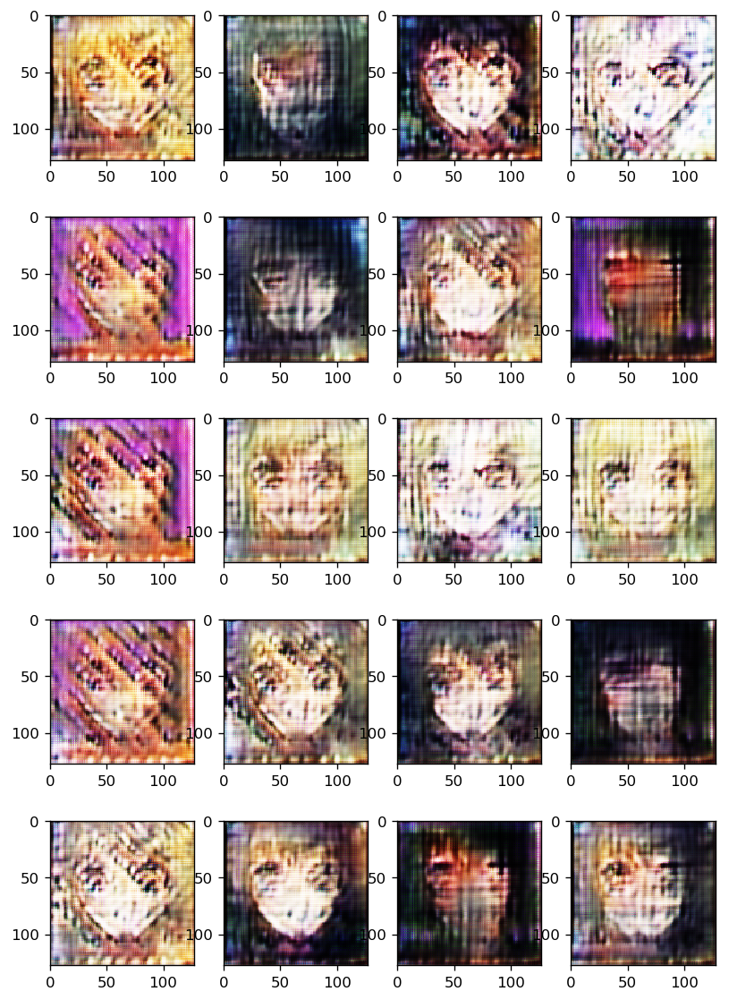

In [14]:
model.generate_images()

### 1000 Epochs (total:2000)

Training for 1000 epochs. . .
1: [D loss: 0.260961  [G loss: 2.785130] Time elapsed:   13.19 sec
20: [D loss: 0.437778  [G loss: 6.654159] Time elapsed:   12.89 sec
40: [D loss: 0.356051  [G loss: 2.021968] Time elapsed:   12.89 sec
60: [D loss: 0.297133  [G loss: 1.800392] Time elapsed:   13.01 sec
80: [D loss: 0.309893  [G loss: 5.164499] Time elapsed:   12.84 sec
100: [D loss: 0.538008  [G loss: 4.090745] Time elapsed:   12.82 sec
120: [D loss: 0.440667  [G loss: 3.220279] Time elapsed:   12.70 sec
140: [D loss: 0.301901  [G loss: 2.175448] Time elapsed:   12.92 sec
160: [D loss: 0.322450  [G loss: 3.521959] Time elapsed:   12.74 sec
180: [D loss: 0.285725  [G loss: 1.921916] Time elapsed:   13.43 sec
200: [D loss: 0.291740  [G loss: 1.806298] Time elapsed:   12.80 sec
220: [D loss: 0.266397  [G loss: 3.514989] Time elapsed:   12.88 sec
240: [D loss: 0.228216  [G loss: 2.044552] Time elapsed:   13.10 sec
260: [D loss: 0.228569  [G loss: 2.305925] Time elapsed:   12.80 sec
280: [D lo

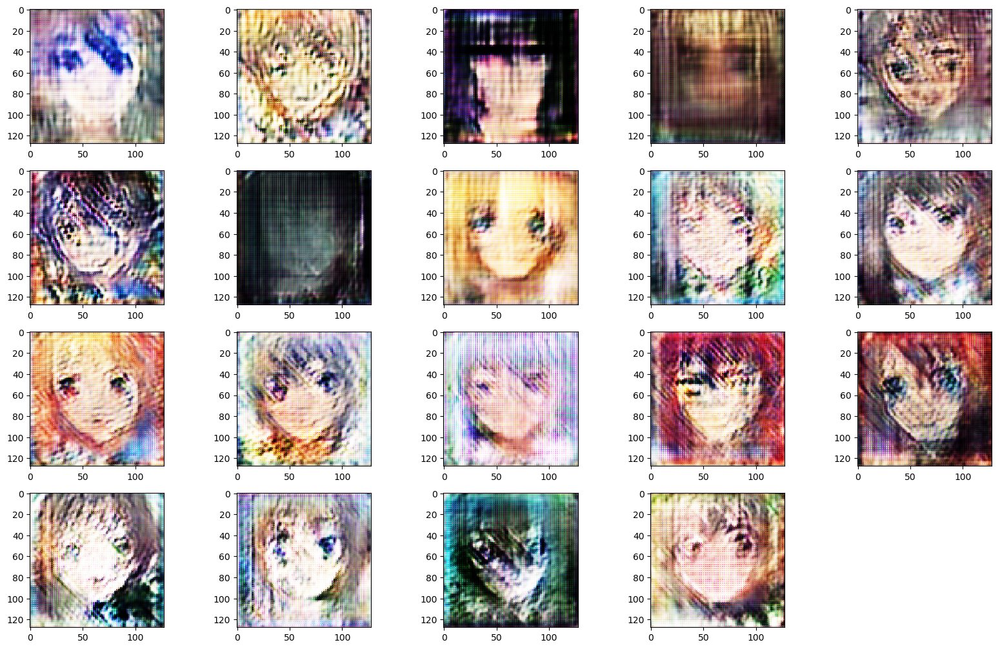

Time elapsed:    3.57 hr


In [15]:
timer = Timer()
e_2, d_2, g_2 = model.train(epochs=1000)
timer.timer()

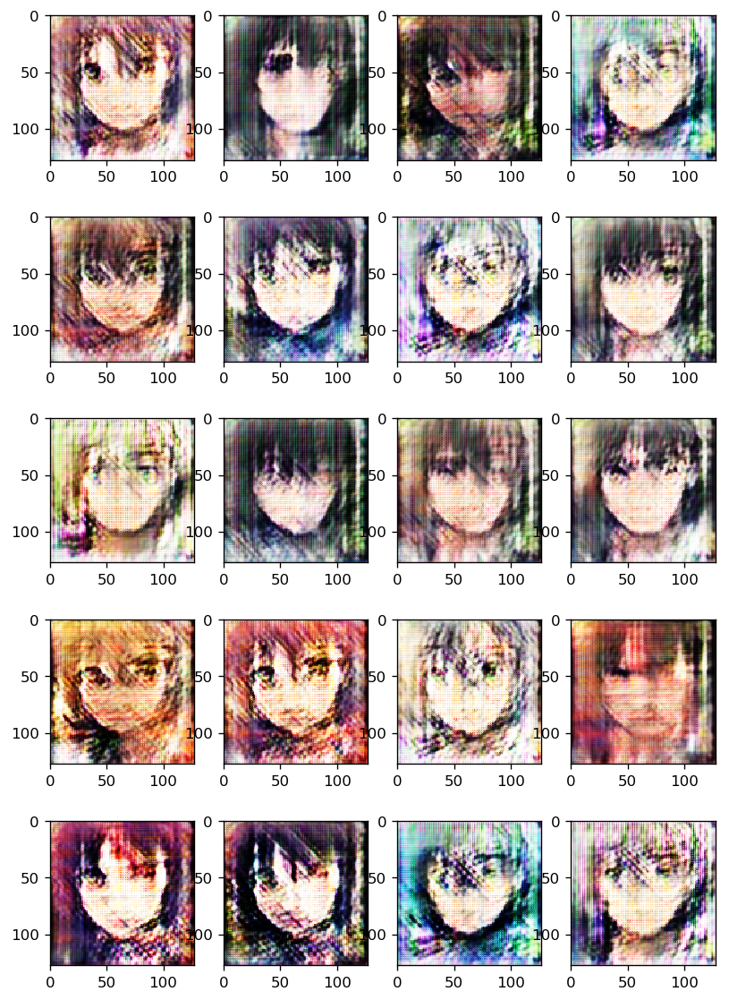

In [23]:
model.generate_images()

In [25]:
from IPython.display import FileLink
#os.chdir(r'kaggle/working')
model.G.save('AnimefaceGAN_G.h5')
FileLink(r'AnimefaceGAN_G.h5')

/kaggle/working/AnimefaceGAN_G.h5

In [26]:
model.D.save('AnimefaceGAN_D.h5')
FileLink(r'AnimefaceGAN_D.h5')

/kaggle/working/AnimefaceGAN_D.h5

In [27]:
model.GAN.save('AnimefaceGAN_GAN.h5')
FileLink(r'AnimefaceGAN_GAN.h5')

/kaggle/working/AnimefaceGAN_GAN.h5

Transferred from Kaggle . . .